In [1]:
import pandas as pd
import numpy as np


In [2]:
df=pd.read_csv('Beta_done.csv')

In [3]:
df=df.drop('Unnamed: 0',axis=1)

In [4]:
pd.set_option('display.max_rows',5000)

In [5]:
df=df.drop(['E(Ri)','minus'],axis=1)

In [6]:
df=df.dropna().reset_index(drop=True)

In [7]:
df.head(5000)

,Beta,Ri,Ticker,date
0,-0.039839,2.736180,ABB IS Equity,2002-07-03
1,-0.038681,0.575850,ABB IS Equity,2002-07-04
2,-0.039663,0.984076,ABB IS Equity,2002-07-05
3,-0.042511,-1.009922,ABB IS Equity,2002-07-08
4,-0.050111,-1.342402,ABB IS Equity,2002-07-09
5,-0.050278,-2.304064,ABB IS Equity,2002-07-10
6,-0.044480,-2.005571,ABB IS Equity,2002-07-11
7,-0.052886,0.606405,ABB IS Equity,2002-07-12
8,-0.049953,-0.357883,ABB IS Equity,2002-07-15
9,-0.047339,-0.907372,ABB IS Equity,2002-07-16


In [8]:
df['r']=df['Ri'].shift(-1)
df=df.dropna()
df

,Beta,Ri,Ticker,date,r
0,-0.039839,2.736180,ABB IS Equity,2002-07-03,0.575850
1,-0.038681,0.575850,ABB IS Equity,2002-07-04,0.984076
2,-0.039663,0.984076,ABB IS Equity,2002-07-05,-1.009922
3,-0.042511,-1.009922,ABB IS Equity,2002-07-08,-1.342402
4,-0.050111,-1.342402,ABB IS Equity,2002-07-09,-2.304064
...,...,...,...,...,...
204059,-0.447118,-5.771704,Z IS Equity,2019-11-29,-0.085310
204060,-0.411990,-0.085310,Z IS Equity,2019-12-02,-4.405738
204061,-0.450626,-4.405738,Z IS Equity,2019-12-03,0.518042
204062,-0.448763,0.518042,Z IS Equity,2019-12-04,6.646526


In [9]:
df=df.sort_values('date').reset_index(drop=True)

In [13]:
df

,Beta,Ri,Ticker,date,r
0,-0.039839,2.736180,ABB IS Equity,2002-07-03,0.407164
1,0.186039,3.782463,BJHI IS Equity,2002-07-03,-0.928064
2,-0.139990,-0.928064,RELI IS Equity,2002-07-03,-0.179462
3,-0.002662,-0.179462,HCBA IS Equity,2002-07-03,-2.350966
4,-0.039984,-2.350966,NCRL IS Equity,2002-07-03,-0.374065
...,...,...,...,...,...
204059,-0.168913,-1.230647,IOCL IS Equity,2019-12-06,0.034972
204060,-0.161577,0.034972,INFO IS Equity,2019-12-06,1.053887
204061,-0.281354,1.053887,JSTL IS Equity,2019-12-06,1.515795
204062,-0.003364,-1.034410,TTAN IS Equity,2019-12-06,0.108424


In [10]:
gk=df.groupby('date')

In [11]:
l=df['date'].unique()
len(l)

4240

In [31]:
d=gk.get_group(l[0])
d=d.sort_values('Beta').reset_index(drop=True)


In [38]:
i=d['Beta'].median()
d[d['Beta']<i]['Ticker'].tolist()


['NDEIL IS Equity',
 'HMCL IS Equity',
 'NIIT IS Equity',
 'RBXY IS Equity',
 'ITC IS Equity',
 'RELI IS Equity',
 'INFO IS Equity',
 'HNDL IS Equity',
 'HCLI IS Equity',
 'NCRL IS Equity',
 'ABB IS Equity',
 'ACC IS Equity',
 'HUVR IS Equity',
 'NEST IS Equity',
 'MTNL IS Equity',
 'DRRD IS Equity',
 'HDFCB IS Equity',
 'SBIN IS Equity',
 'GRASIM IS Equity',
 'NIPCL IS Equity',
 'HCBA IS Equity',
 'Z IS Equity',
 'GLXO IS Equity',
 'SCS IS Equity']

In [42]:
lo=d[d['Beta']<=i]['Ri'].sum()
sho=d[d['Beta']>i]['Ri'].sum()
lo-sho

-8.385226301953892

In [32]:
d.head(5000)

,Beta,Ri,Ticker,date
0,-0.317009,4.072161,NDEIL IS Equity,2002-07-03
1,-0.191168,-0.332858,HMCL IS Equity,2002-07-03
2,-0.176538,1.117318,NIIT IS Equity,2002-07-03
3,-0.176229,-0.091194,RBXY IS Equity,2002-07-03
4,-0.158768,-2.491803,ITC IS Equity,2002-07-03
5,-0.139990,-0.928064,RELI IS Equity,2002-07-03
6,-0.127130,3.537736,INFO IS Equity,2002-07-03
7,-0.060429,-0.098393,HNDL IS Equity,2002-07-03
8,-0.056660,0.663193,HCLI IS Equity,2002-07-03
9,-0.039984,-2.350966,NCRL IS Equity,2002-07-03


In [16]:
df_F=pd.DataFrame(columns=('date','Long','Short','Return','Beta'))

for i in l:
    df_t=gk.get_group(i).reset_index(drop=True)
    #df_t=df_t.sort_values('Beta')
    J=df_t['Beta'].median()
    lob=df_t[df_t['Beta']<=J]['Beta'].sum()
    shob=df_t[df_t['Beta']<=J]['Beta'].sum()
    long=df_t[df_t['Beta']<=J]['Ticker'].tolist()
    short=df_t[df_t['Beta']>J]['Ticker'].tolist()
    lo=df_t[df_t['Beta']<=J]['r'].sum()
    sho=df_t[df_t['Beta']>J]['r'].sum()
    diffb=lob-shob
    diff=(lo-sho)/len(df_t)
    df_F=df_F.append([{'date':i,'Long':long,'Short':short,'Return':diff,'Beta':diffb}])
    
df_F=df_F.reset_index(drop=True)

In [84]:
(df_F[df_F['Return']<0]['Return']).count()

2141

In [85]:
(df_F[df_F['log(1+R)']<0]['log(1+R)']).count()

2136

In [97]:
df_F[df_F['log(1+R)'].isnull()]

,date,Long,Short,Return,log(1+R),cum_sum,Cum Return %
458,2004-05-17,"[HMCL IS Equity, Z IS Equity, BJHI IS Equity, ...","[HUVR IS Equity, TPWR IS Equity, ITC IS Equity...",-145.495324,NaN,NaN,NaN
1351,2007-12-31,"[ACC IS Equity, GAIL IS Equity, GLXO IS Equity...","[BHEL IS Equity, BHARTI IS Equity, TPWR IS Equ...",-430.487396,NaN,NaN,NaN
1592,2008-12-31,"[ITC IS Equity, UT IS Equity, NTPC IS Equity, ...","[HNDL IS Equity, MM IS Equity, RBXY IS Equity,...",-193.791565,NaN,NaN,NaN
1676,2009-05-18,"[CAIR IS Equity, INFO IS Equity, CIPLA IS Equi...","[SUEL IS Equity, ICICIBC IS Equity, TPWR IS Eq...",-117.593798,NaN,NaN,NaN
2898,2014-05-16,"[ITC IS Equity, ONGC IS Equity, PWGR IS Equity...","[PNB IS Equity, HMCL IS Equity, AXSB IS Equity...",-115.540898,NaN,NaN,NaN


In [80]:
df_F[df_F['log(1+R)']*df_F['Return']<0]

,date,Long,Short,Return,log(1+R),cum_sum,Cum Return %


In [17]:
len(df_F)

4240

In [18]:
df_F['Beta'].sum()

0.0

In [64]:
df_F=pd.read_csv('Portfolio.csv')

In [65]:
df_F

,Unnamed: 0,date,Long,Short,Return,Beta,log(1+R),cum_sum,Cum Return %
0,0,2002-07-03,"['ABB IS Equity', 'RELI IS Equity', 'HCBA IS E...","['BJHI IS Equity', 'OBC IS Equity', 'PG IS Equ...",0.119451,0.0,0.001194,0.001194,0.119451
1,1,2002-07-04,"['Z IS Equity', 'INFO IS Equity', 'NDEIL IS Eq...","['TATA IS Equity', 'NRC IS Equity', 'TPWR IS E...",0.112808,0.0,0.001127,0.002321,0.232394
2,2,2002-07-05,"['INFO IS Equity', 'NCRL IS Equity', 'NDEIL IS...","['SKB IS Equity', 'BJHI IS Equity', 'BHEL IS E...",0.015004,0.0,0.000150,0.002471,0.247433
3,3,2002-07-08,"['RELI IS Equity', 'GLXO IS Equity', 'ACC IS E...","['OBC IS Equity', 'BRIT IS Equity', 'BJHI IS E...",0.057898,0.0,0.000579,0.003050,0.305474
4,4,2002-07-09,"['HDFCB IS Equity', 'ITC IS Equity', 'CIPLA IS...","['BRIT IS Equity', 'NRILP IS Equity', 'CLGT IS...",0.267042,0.0,0.002667,0.005717,0.573333
5,5,2002-07-10,"['NEST IS Equity', 'CIPLA IS Equity', 'Z IS Eq...","['IH IS Equity', 'TTCH IS Equity', 'TTMT IS Eq...",0.067144,0.0,0.000671,0.006388,0.640862
6,6,2002-07-11,"['NIPCL IS Equity', 'DRRD IS Equity', 'Z IS Eq...","['IH IS Equity', 'HDFC IS Equity', 'TTMT IS Eq...",0.401809,0.0,0.004010,0.010398,1.045246
7,7,2002-07-12,"['NIIT IS Equity', 'HMCL IS Equity', 'NIPCL IS...","['TGBL IS Equity', 'TTMT IS Equity', 'APNT IS ...",0.054997,0.0,0.000550,0.010948,1.100817
8,8,2002-07-15,"['ACC IS Equity', 'HCLI IS Equity', 'CIPLA IS ...","['TATA IS Equity', 'ACEM IS Equity', 'SBIN IS ...",0.216781,0.0,0.002165,0.013113,1.319985
9,9,2002-07-16,"['HCLI IS Equity', 'HCBA IS Equity', 'NIIT IS ...","['NRILP IS Equity', 'SBIN IS Equity', 'NRC IS ...",0.207383,0.0,0.002072,0.015185,1.530106


In [17]:
df_F['log(1+R)']=np.log(1+(df_F['Return']/100))
df_F

,date,Long,Short,Return,Beta,log(1+R)
0,2002-07-03,"[ABB IS Equity, RELI IS Equity, HCBA IS Equity...","[BJHI IS Equity, OBC IS Equity, PG IS Equity, ...",0.119451,0.0,0.001194
1,2002-07-04,"[Z IS Equity, INFO IS Equity, NDEIL IS Equity,...","[TATA IS Equity, NRC IS Equity, TPWR IS Equity...",0.112808,0.0,0.001127
2,2002-07-05,"[INFO IS Equity, NCRL IS Equity, NDEIL IS Equi...","[SKB IS Equity, BJHI IS Equity, BHEL IS Equity...",0.015004,0.0,0.000150
3,2002-07-08,"[RELI IS Equity, GLXO IS Equity, ACC IS Equity...","[OBC IS Equity, BRIT IS Equity, BJHI IS Equity...",0.057898,0.0,0.000579
4,2002-07-09,"[HDFCB IS Equity, ITC IS Equity, CIPLA IS Equi...","[BRIT IS Equity, NRILP IS Equity, CLGT IS Equi...",0.267042,0.0,0.002667
5,2002-07-10,"[NEST IS Equity, CIPLA IS Equity, Z IS Equity,...","[IH IS Equity, TTCH IS Equity, TTMT IS Equity,...",0.067144,0.0,0.000671
6,2002-07-11,"[NIPCL IS Equity, DRRD IS Equity, Z IS Equity,...","[IH IS Equity, HDFC IS Equity, TTMT IS Equity,...",0.401809,0.0,0.004010
7,2002-07-12,"[NIIT IS Equity, HMCL IS Equity, NIPCL IS Equi...","[TGBL IS Equity, TTMT IS Equity, APNT IS Equit...",0.054997,0.0,0.000550
8,2002-07-15,"[ACC IS Equity, HCLI IS Equity, CIPLA IS Equit...","[TATA IS Equity, ACEM IS Equity, SBIN IS Equit...",0.216781,0.0,0.002165
9,2002-07-16,"[HCLI IS Equity, HCBA IS Equity, NIIT IS Equit...","[NRILP IS Equity, SBIN IS Equity, NRC IS Equit...",0.207383,0.0,0.002072


In [18]:
#df_F['log(1+R)']=np.log(1+(df_F['Return']/100))
df_F['cum_sum'] = df_F['log(1+R)'].cumsum()
df_F['Cum Return %']=(np.exp(df_F['cum_sum'])-1)*100
df_F

,date,Long,Short,Return,Beta,log(1+R),cum_sum,Cum Return %
0,2002-07-03,"[ABB IS Equity, RELI IS Equity, HCBA IS Equity...","[BJHI IS Equity, OBC IS Equity, PG IS Equity, ...",0.119451,0.0,0.001194,0.001194,0.119451
1,2002-07-04,"[Z IS Equity, INFO IS Equity, NDEIL IS Equity,...","[TATA IS Equity, NRC IS Equity, TPWR IS Equity...",0.112808,0.0,0.001127,0.002321,0.232394
2,2002-07-05,"[INFO IS Equity, NCRL IS Equity, NDEIL IS Equi...","[SKB IS Equity, BJHI IS Equity, BHEL IS Equity...",0.015004,0.0,0.000150,0.002471,0.247433
3,2002-07-08,"[RELI IS Equity, GLXO IS Equity, ACC IS Equity...","[OBC IS Equity, BRIT IS Equity, BJHI IS Equity...",0.057898,0.0,0.000579,0.003050,0.305474
4,2002-07-09,"[HDFCB IS Equity, ITC IS Equity, CIPLA IS Equi...","[BRIT IS Equity, NRILP IS Equity, CLGT IS Equi...",0.267042,0.0,0.002667,0.005717,0.573333
5,2002-07-10,"[NEST IS Equity, CIPLA IS Equity, Z IS Equity,...","[IH IS Equity, TTCH IS Equity, TTMT IS Equity,...",0.067144,0.0,0.000671,0.006388,0.640862
6,2002-07-11,"[NIPCL IS Equity, DRRD IS Equity, Z IS Equity,...","[IH IS Equity, HDFC IS Equity, TTMT IS Equity,...",0.401809,0.0,0.004010,0.010398,1.045246
7,2002-07-12,"[NIIT IS Equity, HMCL IS Equity, NIPCL IS Equi...","[TGBL IS Equity, TTMT IS Equity, APNT IS Equit...",0.054997,0.0,0.000550,0.010948,1.100817
8,2002-07-15,"[ACC IS Equity, HCLI IS Equity, CIPLA IS Equit...","[TATA IS Equity, ACEM IS Equity, SBIN IS Equit...",0.216781,0.0,0.002165,0.013113,1.319985
9,2002-07-16,"[HCLI IS Equity, HCBA IS Equity, NIIT IS Equit...","[NRILP IS Equity, SBIN IS Equity, NRC IS Equit...",0.207383,0.0,0.002072,0.015185,1.530106


In [65]:
df_F['Return'].sum()


998.0265973966883

In [66]:
df_F['log(1+R)'].sum()

-69.78400690086127

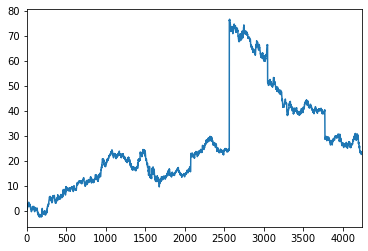

In [21]:
df_F['Cum Return %'].plot()

In [9]:
df

,Beta,Ri,Ticker,date,r
0,-0.039839,2.736180,ABB IS Equity,2002-07-03,0.575850
1,-0.038681,0.575850,ABB IS Equity,2002-07-04,0.984076
2,-0.039663,0.984076,ABB IS Equity,2002-07-05,-1.009922
3,-0.042511,-1.009922,ABB IS Equity,2002-07-08,-1.342402
4,-0.050111,-1.342402,ABB IS Equity,2002-07-09,-2.304064
...,...,...,...,...,...
204059,-0.447118,-5.771704,Z IS Equity,2019-11-29,-0.085310
204060,-0.411990,-0.085310,Z IS Equity,2019-12-02,-4.405738
204061,-0.450626,-4.405738,Z IS Equity,2019-12-03,0.518042
204062,-0.448763,0.518042,Z IS Equity,2019-12-04,6.646526


In [17]:
gk=df_w.groupby('date')
l=df_w['date'].unique()

In [15]:
gkg=df.groupby('Ticker')

In [81]:
'ABB IS Equity' not in (df['Ticker'].tolist())

False

In [13]:
lg=df['Ticker'].unique()
len(lg)

106

In [55]:
df_t1=gk.get_group(l[0]).reset_index(drop=True).set_index('Ticker')
df_t1[df_t1['Beta']<=J].index.tolist()

['ABB IS Equity',
 'RELI IS Equity',
 'HCBA IS Equity',
 'NCRL IS Equity',
 'ACC IS Equity',
 'OBC IS Equity',
 'HUVR IS Equity',
 'PG IS Equity',
 'DRRD IS Equity',
 'HDFC IS Equity',
 'GRASIM IS Equity',
 'TTCH IS Equity',
 'CIPLA IS Equity',
 'NEST IS Equity',
 'Z IS Equity',
 'SBIN IS Equity',
 'HCLI IS Equity',
 'HNDL IS Equity',
 'HDFCB IS Equity',
 'RBXY IS Equity',
 'APNT IS Equity',
 'NRC IS Equity',
 'NIIT IS Equity',
 'HMCL IS Equity',
 'INFO IS Equity',
 'NIPCL IS Equity',
 'NRILP IS Equity',
 'ITC IS Equity',
 'LT IS Equity',
 'GLXO IS Equity',
 'MTNL IS Equity',
 'BHEL IS Equity',
 'NDEIL IS Equity',
 'CSTRL IS Equity',
 'SCS IS Equity',
 'RIL IS Equity',
 'IH IS Equity']

In [16]:
df_w=pd.DataFrame()
for i in lg:
    df_t=gkg.get_group(i)
    df_t['log(1+r)']=np.log(1+df['r']/100)
    df_t['CumR']=df_t['log(1+r)'].cumsum()
    df_w=df_w.append(df_t).reset_index(drop=True)
df_w.head(5000)

/home/devansh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/home/devansh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


,Beta,Ri,Ticker,date,r,log(1+r),CumR
0,-0.039839,2.736180,ABB IS Equity,2002-07-03,0.575850,0.005742,0.005742
1,-0.038681,0.575850,ABB IS Equity,2002-07-04,0.984076,0.009793,0.015535
2,-0.039663,0.984076,ABB IS Equity,2002-07-05,-1.009922,-0.010151,0.005384
3,-0.042511,-1.009922,ABB IS Equity,2002-07-08,-1.342402,-0.013515,-0.008131
4,-0.050111,-1.342402,ABB IS Equity,2002-07-09,-2.304064,-0.023310,-0.031441
5,-0.050278,-2.304064,ABB IS Equity,2002-07-10,-2.005571,-0.020260,-0.051701
6,-0.044480,-2.005571,ABB IS Equity,2002-07-11,0.606405,0.006046,-0.045655
7,-0.052886,0.606405,ABB IS Equity,2002-07-12,-0.357883,-0.003585,-0.049240
8,-0.049953,-0.357883,ABB IS Equity,2002-07-15,-0.907372,-0.009115,-0.058355
9,-0.047339,-0.907372,ABB IS Equity,2002-07-16,0.400610,0.003998,-0.054357


In [32]:
import math as m
l.sort()
df_W=pd.DataFrame(columns=('date','Long','Short','Return','Beta'))

for j in range(0,len(l)-4,5):
    i=l[j]
    df_t=gk.get_group(i).reset_index(drop=True).set_index('Ticker',drop=True)
    df_t5=gk.get_group(l[j+4]).reset_index(drop=True).set_index('Ticker',drop=True)
    #df_t=df_t.sort_values('Beta')
    J=df_t['Beta'].median()
    lob=df_t[df_t['Beta']<=J]['Beta'].sum()
    shob=df_t[df_t['Beta']<=J]['Beta'].sum()
    long=df_t[df_t['Beta']<=J].index.tolist()
    short=df_t[df_t['Beta']>J].index.tolist()
    lo=0
    cl=0
    for k in long:
        if k in (df_t5.index):
            term=df_t5.at[k,'CumR']-df_t.at[k,'CumR']
            lo=lo+m.exp(term)-1
            cl=cl+1
    sho=0
    cs=0
    for k in short:
        if k in (df_t5.index):
            term=df_t5.at[k,'CumR']-df_t.at[k,'CumR']
            sho=sho+m.exp(term)-1
            cs=cs+1
    #lo=df_t[df_t['Beta']<=J]['r'].sum()
    #sho=df_t[df_t['Beta']>J]['r'].sum()
    diffb=lob-shob
    
    diff=(lo-sho)/(cs+cl)
    df_W=df_W.append([{'date':i,'Long':long,'Short':short,'Return':diff*100,'Beta':diffb}]).reset_index(drop=True)
    


In [33]:

df_W.to_csv('Weekly.csv')

In [34]:
df_W

,date,Long,Short,Return,Beta
0,2002-07-03,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[TTCH IS Equity, BHEL IS Equity, BJHI IS Equit...",-0.592129,0.0
1,2002-07-10,"[ABB IS Equity, INFO IS Equity, SCS IS Equity,...","[GRASIM IS Equity, TTCH IS Equity, BHEL IS Equ...",0.441639,0.0
2,2002-07-17,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[TTCH IS Equity, BHEL IS Equity, SCS IS Equity...",-0.254356,0.0
3,2002-07-24,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[BHEL IS Equity, BJHI IS Equity, APNT IS Equit...",-0.036147,0.0
4,2002-07-31,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[BHEL IS Equity, SCS IS Equity, BJHI IS Equity...",0.446085,0.0
5,2002-08-07,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[TTCH IS Equity, BHEL IS Equity, SCS IS Equity...",0.283903,0.0
6,2002-08-14,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[BHEL IS Equity, SCS IS Equity, BJHI IS Equity...",-0.066582,0.0
7,2002-08-22,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[BHEL IS Equity, SCS IS Equity, BJHI IS Equity...",-0.593060,0.0
8,2002-08-29,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[BHEL IS Equity, SCS IS Equity, BJHI IS Equity...",-0.655668,0.0
9,2002-09-05,"[INFO IS Equity, GRASIM IS Equity, TTCH IS Equ...","[ABB IS Equity, BHEL IS Equity, SCS IS Equity,...",-0.838004,0.0


In [35]:
df_W['log(1+R)']=np.log(1+(df_W['Return']/100))
df_W['cum_sum'] = df_W['log(1+R)'].cumsum()
df_W['Cum Return %']=(np.exp(df_W['cum_sum'])-1)*100
df_W


,date,Long,Short,Return,Beta,log(1+R),cum_sum,Cum Return %
0,2002-07-03,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[TTCH IS Equity, BHEL IS Equity, BJHI IS Equit...",-0.592129,0.0,-0.005939,-0.005939,-0.592129
1,2002-07-10,"[ABB IS Equity, INFO IS Equity, SCS IS Equity,...","[GRASIM IS Equity, TTCH IS Equity, BHEL IS Equ...",0.441639,0.0,0.004407,-0.001532,-0.153105
2,2002-07-17,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[TTCH IS Equity, BHEL IS Equity, SCS IS Equity...",-0.254356,0.0,-0.002547,-0.004079,-0.407072
3,2002-07-24,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[BHEL IS Equity, BJHI IS Equity, APNT IS Equit...",-0.036147,0.0,-0.000362,-0.004441,-0.443072
4,2002-07-31,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[BHEL IS Equity, SCS IS Equity, BJHI IS Equity...",0.446085,0.0,0.004451,0.000010,0.001036
5,2002-08-07,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[TTCH IS Equity, BHEL IS Equity, SCS IS Equity...",0.283903,0.0,0.002835,0.002845,0.284942
6,2002-08-14,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[BHEL IS Equity, SCS IS Equity, BJHI IS Equity...",-0.066582,0.0,-0.000666,0.002179,0.218171
7,2002-08-22,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[BHEL IS Equity, SCS IS Equity, BJHI IS Equity...",-0.593060,0.0,-0.005948,-0.003769,-0.376182
8,2002-08-29,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[BHEL IS Equity, SCS IS Equity, BJHI IS Equity...",-0.655668,0.0,-0.006578,-0.010347,-1.029384
9,2002-09-05,"[INFO IS Equity, GRASIM IS Equity, TTCH IS Equ...","[ABB IS Equity, BHEL IS Equity, SCS IS Equity,...",-0.838004,0.0,-0.008415,-0.018763,-1.858761


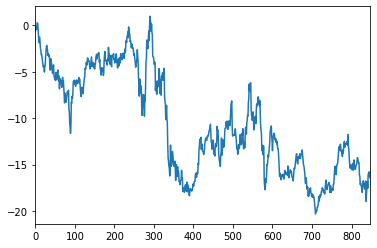

In [36]:
df_W['Cum Return %'].plot()

In [37]:
import math as m
l.sort()
df_M=pd.DataFrame(columns=('date','Long','Short','Return','Beta'))

for j in range(0,len(l)-20,21):
    i=l[j]
    df_t=gk.get_group(i).reset_index(drop=True).set_index('Ticker',drop=True)
    df_t5=gk.get_group(l[j+20]).reset_index(drop=True).set_index('Ticker',drop=True)
    #df_t=df_t.sort_values('Beta')
    J=df_t['Beta'].median()
    lob=df_t[df_t['Beta']<=J]['Beta'].sum()
    shob=df_t[df_t['Beta']<=J]['Beta'].sum()
    long=df_t[df_t['Beta']<=J].index.tolist()
    short=df_t[df_t['Beta']>J].index.tolist()
    lo=0
    cl=0
    for k in long:
        if k in (df_t5.index):
            term=df_t5.at[k,'CumR']-df_t.at[k,'CumR']
            lo=lo+m.exp(term)-1
            cl=cl+1
    sho=0
    cs=0
    for k in short:
        if k in (df_t5.index):
            term=df_t5.at[k,'CumR']-df_t.at[k,'CumR']
            sho=sho+m.exp(term)-1
            cs=cs+1
    #lo=df_t[df_t['Beta']<=J]['r'].sum()
    #sho=df_t[df_t['Beta']>J]['r'].sum()
    diffb=lob-shob
    
    diff=(lo-sho)/(cs+cl)
    df_M=df_M.append([{'date':i,'Long':long,'Short':short,'Return':diff*100,'Beta':diffb}]).reset_index(drop=True)
    


In [38]:
df_M

,date,Long,Short,Return,Beta
0,2002-07-03,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[TTCH IS Equity, BHEL IS Equity, BJHI IS Equit...",-1.013147,0.0
1,2002-08-01,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[BHEL IS Equity, SCS IS Equity, BJHI IS Equity...",1.458662,0.0
2,2002-09-02,"[INFO IS Equity, GRASIM IS Equity, TTCH IS Equ...","[ABB IS Equity, BHEL IS Equity, SCS IS Equity,...",0.290529,0.0
3,2002-10-03,"[INFO IS Equity, GRASIM IS Equity, TTCH IS Equ...","[ABB IS Equity, BHEL IS Equity, SCS IS Equity,...",-1.744768,0.0
4,2002-11-05,"[INFO IS Equity, GRASIM IS Equity, TTCH IS Equ...","[ABB IS Equity, BHEL IS Equity, SCS IS Equity,...",-2.950451,0.0
5,2002-12-06,"[INFO IS Equity, TTCH IS Equity, BHEL IS Equit...","[ABB IS Equity, GRASIM IS Equity, SCS IS Equit...",1.388646,0.0
6,2003-01-07,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[BJHI IS Equity, HUVR IS Equity, HMCL IS Equit...",1.669600,0.0
7,2003-02-05,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[TTCH IS Equity, BJHI IS Equity, HUVR IS Equit...",0.184417,0.0
8,2003-03-07,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[TTCH IS Equity, BJHI IS Equity, HUVR IS Equit...",-1.231693,0.0
9,2003-04-09,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[TTCH IS Equity, BJHI IS Equity, HUVR IS Equit...",-2.311820,0.0


In [39]:
df_M['log(1+R)']=np.log(1+(df_M['Return']/100))
df_M['cum_sum'] = df_M['log(1+R)'].cumsum()
df_M['Cum Return %']=(np.exp(df_M['cum_sum'])-1)*100
df_M


,date,Long,Short,Return,Beta,log(1+R),cum_sum,Cum Return %
0,2002-07-03,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[TTCH IS Equity, BHEL IS Equity, BJHI IS Equit...",-1.013147,0.0,-0.010183,-0.010183,-1.013147
1,2002-08-01,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[BHEL IS Equity, SCS IS Equity, BJHI IS Equity...",1.458662,0.0,0.014481,0.004298,0.430737
2,2002-09-02,"[INFO IS Equity, GRASIM IS Equity, TTCH IS Equ...","[ABB IS Equity, BHEL IS Equity, SCS IS Equity,...",0.290529,0.0,0.002901,0.007199,0.722518
3,2002-10-03,"[INFO IS Equity, GRASIM IS Equity, TTCH IS Equ...","[ABB IS Equity, BHEL IS Equity, SCS IS Equity,...",-1.744768,0.0,-0.017602,-0.010402,-1.034857
4,2002-11-05,"[INFO IS Equity, GRASIM IS Equity, TTCH IS Equ...","[ABB IS Equity, BHEL IS Equity, SCS IS Equity,...",-2.950451,0.0,-0.029949,-0.040351,-3.954775
5,2002-12-06,"[INFO IS Equity, TTCH IS Equity, BHEL IS Equit...","[ABB IS Equity, GRASIM IS Equity, SCS IS Equit...",1.388646,0.0,0.013791,-0.026560,-2.621047
6,2003-01-07,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[BJHI IS Equity, HUVR IS Equity, HMCL IS Equit...",1.669600,0.0,0.016558,-0.010002,-0.995207
7,2003-02-05,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[TTCH IS Equity, BJHI IS Equity, HUVR IS Equit...",0.184417,0.0,0.001842,-0.008159,-0.812626
8,2003-03-07,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[TTCH IS Equity, BJHI IS Equity, HUVR IS Equit...",-1.231693,0.0,-0.012393,-0.020553,-2.034310
9,2003-04-09,"[ABB IS Equity, INFO IS Equity, GRASIM IS Equi...","[TTCH IS Equity, BJHI IS Equity, HUVR IS Equit...",-2.311820,0.0,-0.023390,-0.043942,-4.299100


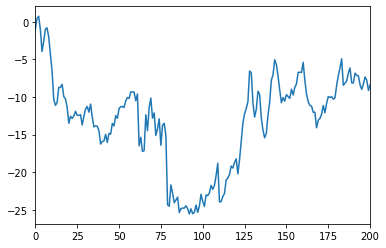

In [40]:
df_M['Cum Return %'].plot()

In [42]:
df_M.to_csv('Monthly.csv')